# **Лабораторная работа №4**

*Параллельный алгоритм размытия изображения на CUDA*

**Постановка задачи:** размыть изображение с применением фильтра Гаусса с использованием средств распараллеливания CUDA. 

Общее описание алгоритма: дано изображение NxM, как известно изображение может быть представлен в формате RGB, где каждый пиксель представлен числами от 0 до 255. Требуется создать фильтра размытия, представленный в виде свёрточной матрицы заполненной в соответствии с Гауссовским распределением в двумере (сигму можно сделать параметром), от размера матрицы зависит степень размытия, для теста использовалась матрица 3x3. Можно так же сделать это параметром и поэкспериментировать с различными размерностями. Можно использовать уже известные матрицы свёртки. Затем данный фильтр применяется для каждого пикселя исходного изображения, результат суммируется и записывается в пиксель выходного массива. 

Для работы с краями можно почитать тут https://habr.com/ru/post/142818/, там же есть вполне подробное описание алгоритма и даны примеры свёрточных матриц. В результате все три канала формируют изображение. Можно воспользоваться любой библиотекой для этого (во вложении питоновский ноутбук преобразования изображения в RGB, можете его переписать под нормальный вывод RGB массивов). CUDA достаточно использовать для непосредственно размытия изображения, для предпроцессинга и постпроцессинга RGB каналов ниже описаны специальные функции.

Альтернатива: для тех кому совсем не хочется разбираться с изображениями, можно реализовать алгоритм свёртки матрицы и протестировать его на CUDA для различных размерностей, оценка за это будет соответственно ниже

Содержание отчёта: сравнить время работы алгоритма свёртки или полного метода размытия для различных размерностей матрицы\картинки с CUDA и без, привести пример размытого изображения. Для тестов можно использовать приложенные матрицы и изображения, размытое изображение было получено не программно, так что возможно не точное совпадение при проверке. **Отчет и программу следует писать в этом ноутбуке.** По результату запуска всех секций в ноутбуке, должны выводиться полученные картинки и графики. Если Вам необходимо отправить вместе с ноутбуком дополнительные файлы - отправить их архивом вместе с этим ноутбуком.

Критерии оценивания: 
* 4 балла – алгоритм свёртки для матрицы
* 4 балла – полный метод размытия
* 2 балла – отчёт



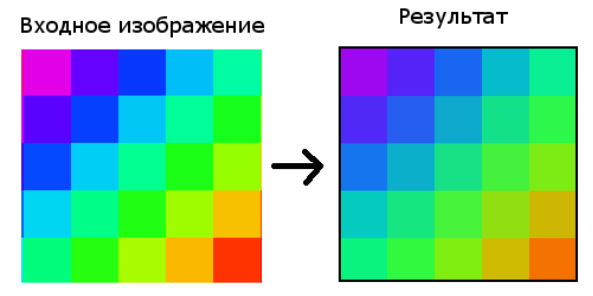

Функция get_RGB(from,to) переводит изображение from в текстовый файл в следующем формате: в первой строке длина и ширина картинки в пикселях. В последующих строчках идут три матрицы для красного, зеленого и синего цвета соотвествующего размера.

Функция read_image(from,to) переводит файл в формате, который описан выше, в RGB изображение.

In [102]:
from PIL import Image
import numpy as np
def get_RGB(image,text):
    img = Image.open(image)
    rgbimg = img.convert('RGB')
    A = []
    for i in range(np.shape(rgbimg)[0]):
        for j in range(np.shape(rgbimg)[1]):
            A.append(rgbimg.getpixel((j,i)))
    A = np.array(A)
    file1 = open(text,"w")
    file1.write(str(np.shape(rgbimg)[0]) + " " + str(np.shape(rgbimg)[1]) + "\n")
    for i in range(3):
        B = A[:, i].reshape(np.shape(rgbimg)[0], np.shape(rgbimg)[1])
        for k in range(B.shape[0]):
            for l in range(B.shape[1]):
                file1.write(str(B[k,l]) + " ");
            file1.write("\n")
    file1.close()
    
def read_image(text,image):
    file = open(text,"r")
    w,h = map(int,file.readline().split())
    A = []
    for i in range(3):
        B = []
        for k in range(w):
            B.append(list(map(np.uint8,file.readline().split())))
        A.append(B)
    A = np.array(A)
    A = A.transpose(1,2,0)
    file.close()
    new_im = Image.fromarray(A,'RGB')
    new_im.save(image)

Для того, чтобы размыть изображение, понадобится матрица свертки. Код ниже создает матрицу 3 на 3 в соответствии с Гауссовским распределением в двумере.

Подключаем CUDA (не забудьте сменить среду выполнения на GPU): 

In [103]:
!pip install git+git://github.com/andreinechaev/nvcc4jupyter.git
!pip install ipyplot
%load_ext nvcc_plugin

  Cloning git://github.com/andreinechaev/nvcc4jupyter.git to /tmp/pip-req-build-tir1ykyn
  Running command git clone -q git://github.com/andreinechaev/nvcc4jupyter.git /tmp/pip-req-build-tir1ykyn
  Created wheel for NVCCPlugin: filename=NVCCPlugin-0.0.2-cp36-none-any.whl size=4308 sha256=68c0fb031fcd2c12d3eb02154777ec503531db539cbc3970349ae5a431b91258
  Stored in directory: /tmp/pip-ephem-wheel-cache-6ux0jcjz/wheels/10/c2/05/ca241da37bff77d60d31a9174f988109c61ba989e4d4650516
Successfully built NVCCPlugin
The nvcc_plugin extension is already loaded. To reload it, use:
  %reload_ext nvcc_plugin


In [104]:
DATA_DIR = "data/"
OUTPUT_DIR = "blurred/"
TMP_DIR = "tmp/"

images = [
    "test.tiff",
    "ex1.jpg",
    "ex2.jpg",
    "ex3.jpg",
    "ex4.jpg",
    "ex5.jpg",
    "ex6.jpg",
    "ex7.jpg",
    "ex8.jpg"
]

for img in images:
    get_RGB(DATA_DIR + img, TMP_DIR + img.split('.')[0] + ".txt")


# Описание алогритма

Картинку считываем из текстового файла, добавляем паддинги. Для каждого канала храним отдельный вектор из пикселей. Всю картинку схлапываем в один вектор для удобства передачи на гпу.

Матрица конволюций предстваляет собой матрицу Гауссовского распределения из статьи.

Для вычисления cpu просто начинаем поочереди считать результат конволюции для каждой клетки и записывать в новый вектор. 

Для вычисления на GPU создаем на нем копии картинки и матрицы конволюции, также создаем пустое изоброжение, в которое будем складывать результат. Затем начинаем параллельно вычислять новые значения и класть их в результирующий вектор.

In [105]:
%%cu
#include <iostream>
#include <array>
#include <chrono>
#include <cmath>
#include <fstream>
#include <vector>

const std::string prefix = "/content/tmp/";
const std::vector<std::string> images {
        "test",
        "ex1",
        "ex2",
        "ex3",
        "ex4",
        "ex5",
        "ex6",
        "ex7",
        "ex8"
};
constexpr size_t CHANNELS_AMOUNT = 3;
const std::string log_file = prefix + "run_log.txt";
auto run_log = std::fstream(log_file, std::fstream::out | std::fstream::trunc);

class Kernel{
public:
    Kernel(size_t size, double sigma)
    : size(size)
    , sigma(sigma)
    , conv(size * size, 0)
    {
        init_conv();
    }

    double get(size_t x, size_t y) const
    {
        return conv[x * size + y];
    }

    double* get_conv() {
        return conv.data();
    }
private:
    size_t size;
    double sigma;
    std::vector<double> conv;

    static double G(double x, double mu, double sigma)
    {
        const auto fraction = (x - mu) / sigma;
        return std::exp(-std::pow(fraction, 2) / 2);
    }

    void init_conv()
    {
        double mu = size / 2;
        double sum = 0;
        for (size_t x = 0; x < size; ++x) {
            for (size_t y = 0; y < size; ++y) {
                conv[x * size + y] = G(x, mu, sigma) *  G(y, mu, sigma) / (2 * M_PI * std::pow(sigma, 2));
                sum += conv[x * size + y];
            }
        }
        for (size_t x = 0; x < size; ++x) {
            for (size_t y = 0; y < size; ++y) {
                conv[x * size + y] /= sum;
            }
        }
    }
};

class IMG {
public:
    using PIXEL_TYPE = std::uint8_t;
    IMG(const std::string& filename, const size_t pad)
    : pad(pad)
    {
        auto file = std::fstream(filename);
        file >> height >> width;
        width_pad = width + 2 * pad;
        height_pad = height + 2 * pad;
        img = std::vector<std::vector<PIXEL_TYPE>>(CHANNELS_AMOUNT,std::vector<PIXEL_TYPE>((height + pad * 2) * (width + pad * 2), 0));
        for (size_t c = 0; c < CHANNELS_AMOUNT; ++c) {
            for (size_t x = pad; x < height + pad; ++x) {
                for (size_t y = pad; y < width + pad; ++y) {
                    size_t pix;
                    file >> pix;
                    img[c][x * width_pad + y] = static_cast<PIXEL_TYPE>(pix);
                }
            }
        }
    }

    void Perform_Convolution(const Kernel& kern) {
        for (size_t c = 0; c < CHANNELS_AMOUNT; ++c) {
            auto resp = img[c];
            for (size_t x = pad; x < height + pad; ++x) {
                for (size_t y = pad; y < width + pad; ++y) {
                    double blur_val = 0;
                    int shift = pad;
                    for (int dx = -shift; dx <= shift; ++dx) {
                        for (int dy = -shift; dy <= shift; ++dy) {
                            blur_val += kern.get(shift + dx, shift + dy) * img[c][(x + dx) * width_pad + y + dy];
                        }
                    }
                    resp[x * width_pad + y] = static_cast<PIXEL_TYPE>(blur_val);
                }
            }
            img[c] = resp;
        }
    }

    void to_file(std::string outfile) {
        auto file = std::fstream{outfile, std::fstream::out | std::fstream::trunc};
        file << height << " " << width << "\n";
        for (size_t c = 0; c < CHANNELS_AMOUNT; ++c) {
            for (size_t x = pad; x < height + pad; ++x) {
                for (size_t y = pad; y < width + pad; ++y) {
                    file << std::to_string(img[c][x * width_pad + y]) << " ";
                }
                file << "\n";
            }
        }
    }

    PIXEL_TYPE* get_channel(size_t c) {
        return img[c].data();
    }

    size_t Size() {
        return height_pad * width_pad * CHANNELS_AMOUNT;
    }

    size_t pad, width, height, height_pad, width_pad;
private:
    std::vector<std::vector<PIXEL_TYPE>> img;
};

void cpu_run(std::string filename, size_t conv_size) {
    Kernel kernel(conv_size, 1);
    IMG img(prefix + filename + ".txt", conv_size / 2);
    auto t1 = std::chrono::high_resolution_clock::now();
    img.Perform_Convolution(kernel);
    auto t2 = std::chrono::high_resolution_clock::now();
    auto duration = std::chrono::duration_cast<std::chrono::milliseconds>( t2 - t1 ).count();
    run_log << "CPU, " << img.width * img.height << ", " << conv_size << ", " << duration << "\n";
    img.to_file(prefix + "cpu_" + std::to_string(conv_size) + "_" + filename + ".out");
}

#ifdef __NVCC__

__global__ void process_one_cell(const IMG::PIXEL_TYPE* img, IMG::PIXEL_TYPE* resp, size_t height, size_t width,
                                 size_t pad, const double* kern, size_t kernel_size) {
    const int y = blockIdx.y * blockDim.y + threadIdx.y;
    const int x = blockIdx.x * blockDim.x + threadIdx.x;

    if (x < pad || y < pad || x >= height + pad || y >= width + pad) {
        return;
    }

    double blur_val = 0;
    int shift = pad;
    for (int dx = -shift; dx <= shift; ++dx) {
        for (int dy = -shift; dy <= shift; ++dy) {
            blur_val += kern[(shift + dx) * kernel_size + shift + dy] * img[(x + dx) * (width + 2 * pad) + y + dy];
        }
    }
    resp[x * (width + 2 * pad) + y] = static_cast<IMG::PIXEL_TYPE>(blur_val);
}

void gpu_run(const std::string& filename, size_t conv_size) {
    Kernel kernel(conv_size, 1);
    IMG img(prefix + filename + ".txt", conv_size / 2);
    auto img_size = sizeof(IMG::PIXEL_TYPE) * img.height_pad * img.width_pad;

    cudaEvent_t t1, t2;
    cudaEventCreate(&t1);
    cudaEventCreate(&t2);

    std::vector<IMG::PIXEL_TYPE*> img_channels(CHANNELS_AMOUNT, nullptr);
    for (auto& channel : img_channels) {
        cudaMalloc(&channel, img_size);
    }
    for (size_t c = 0; c < CHANNELS_AMOUNT; ++c) {
        cudaMemcpy(img_channels[c], img.get_channel(c), img_size, cudaMemcpyHostToDevice);
    }

    auto result = std::vector<IMG::PIXEL_TYPE *>(CHANNELS_AMOUNT, nullptr);
    for (auto& channel : result) {
        cudaMalloc(&channel, img_size);
    }

    auto kern_size = sizeof(double) * conv_size * conv_size;
    double* kern = nullptr;
    cudaMalloc(&kern, kern_size);
    cudaMemcpy(kern, kernel.get_conv(), kern_size, cudaMemcpyHostToDevice);

    cudaEventRecord(t1);

    const auto threads = dim3{16, 16};
    const auto blocks = dim3{img.height_pad / threads.x + 1, img.width_pad / threads.y + 1};
    for (size_t c = 0; c < CHANNELS_AMOUNT; ++c) {
        process_one_cell<<<blocks, threads>>>(img_channels[c], result[c], img.height,
                                              img.width, img.pad, kern, conv_size);
    }

    cudaEventRecord(t2);

    for (size_t c = 0; c < CHANNELS_AMOUNT; ++c) {
        cudaMemcpy(img.get_channel(c), result[c], img_size, cudaMemcpyDeviceToHost);
    }

    for (auto channel : img_channels) {
        cudaFree(channel);
    }
    for (auto channel : result) {
    cudaFree(channel);
    }
    cudaFree(kern);

    cudaEventSynchronize(t2);
    float duration;
    cudaEventElapsedTime(&duration, t1, t2);
    run_log << "GPU, " << img.width * img.height << ", " << conv_size << ", " << duration << "\n";
    img.to_file(prefix + "gpu_" + std::to_string(conv_size) + "_" + filename + ".out");
}

#endif  // __NVCC__



int main() {
    for (size_t conv_size = 3; conv_size <= 15; conv_size += 2) {
        for (auto i: images) {
            cpu_run(i, conv_size);
        }
    }

#ifdef __NVCC__
    for (size_t conv_size = 3; conv_size <= 15; conv_size += 2) {
        for (auto i: images) {
            gpu_run(i, conv_size);
        }
    }
#endif  // __NVCC__

}


In [106]:
for img in images:
    im, form = img.split(".")
    read_image("/content/tmp/" + "gpu_3_" + im + ".out", OUTPUT_DIR + "blurred_3_" + img)
    read_image("/content/tmp/" + "gpu_15_" + im + ".out", OUTPUT_DIR + "blurred_15_" + img)

# Результат размытия для матриц конволюции размера 3 и 15


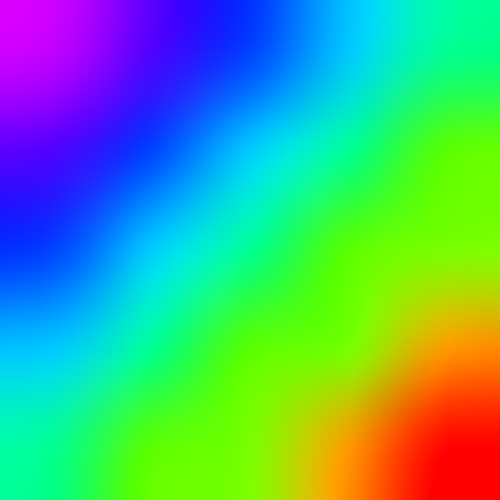


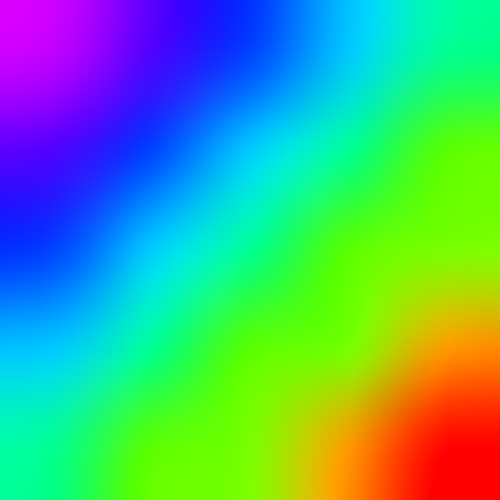


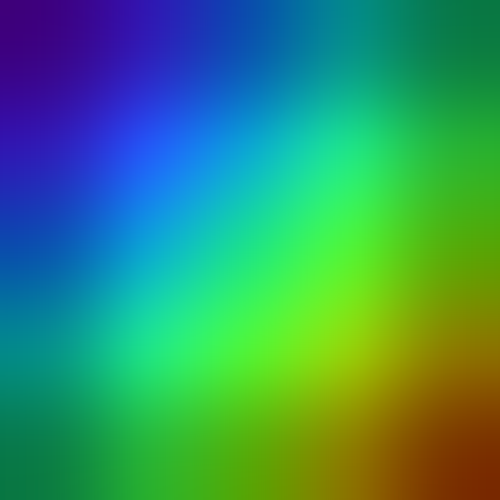


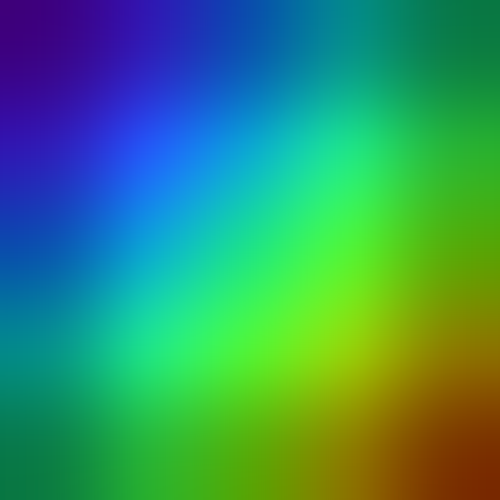


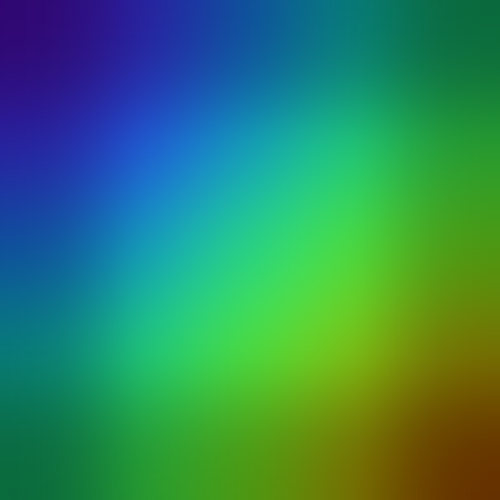


...


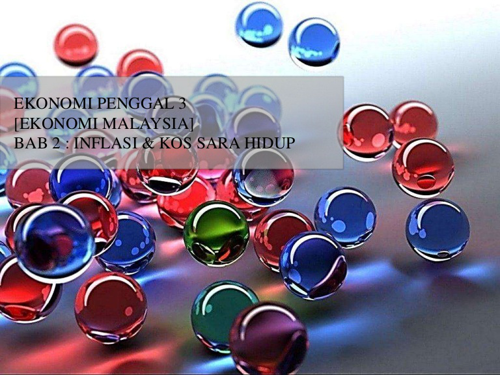


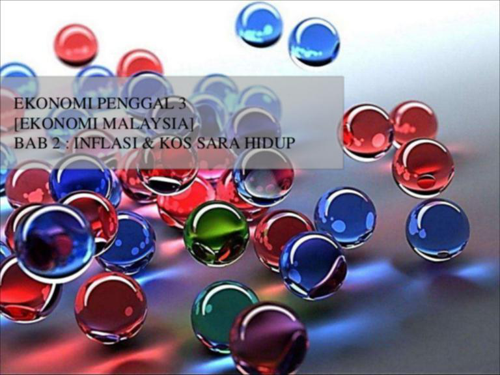


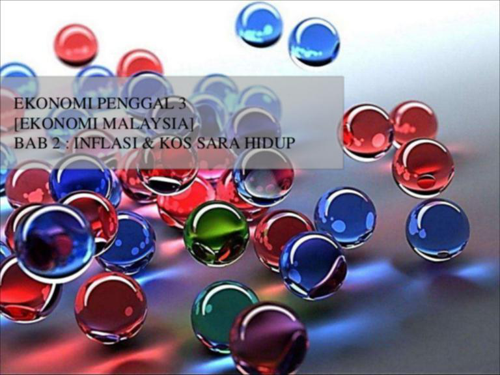


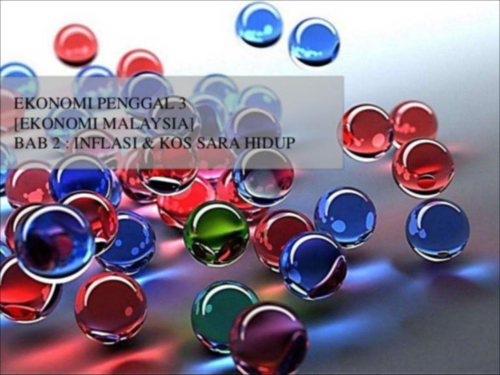


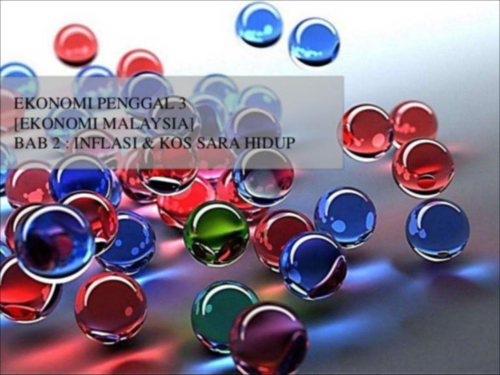

In [107]:
import ipyplot
for img in images:
    ipyplot.plot_images(
    [DATA_DIR + img],
    img_width=500,
    force_b64=True,
    )
    ipyplot.plot_images(
    [OUTPUT_DIR + "blurred_3_" + img],
    img_width=500,
    force_b64=True,
    )
    ipyplot.plot_images(
    [OUTPUT_DIR + "blurred_15_" + img],
    img_width=500,
    force_b64=True,
    )

In [108]:
import pandas as pd
import matplotlib.pyplot as plt

time_data = pd.read_csv("/content/tmp/run_log.txt", names=['type', 'image_size', 'kernel_size', 'duration'])

# Сравнение скорости вычисления на GPU и CPU

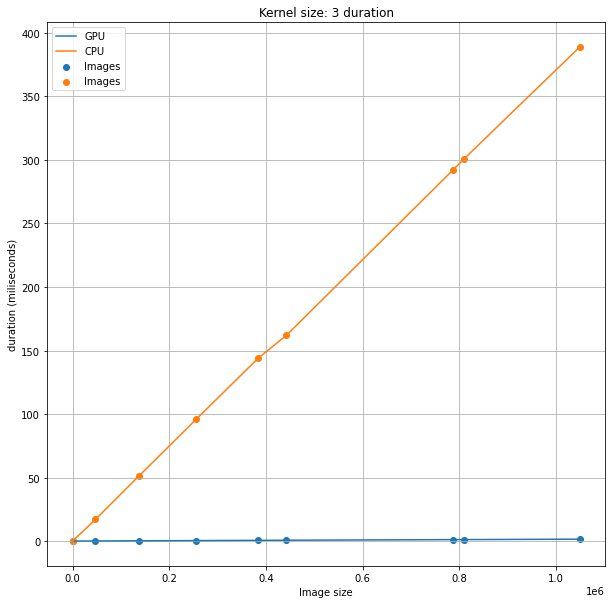

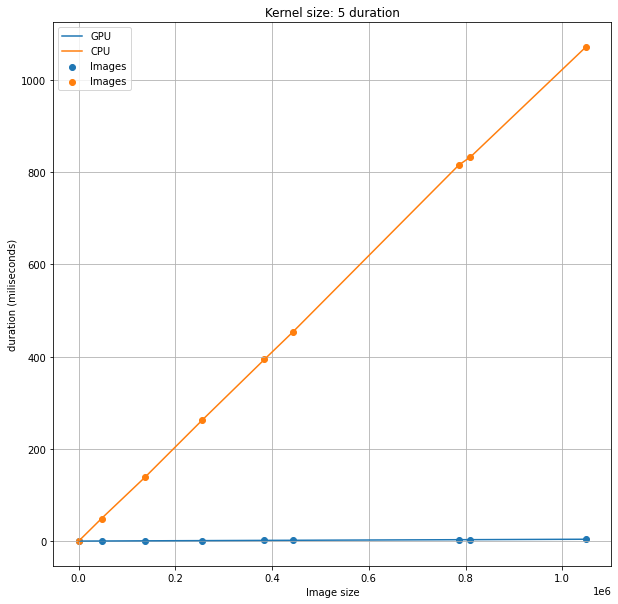

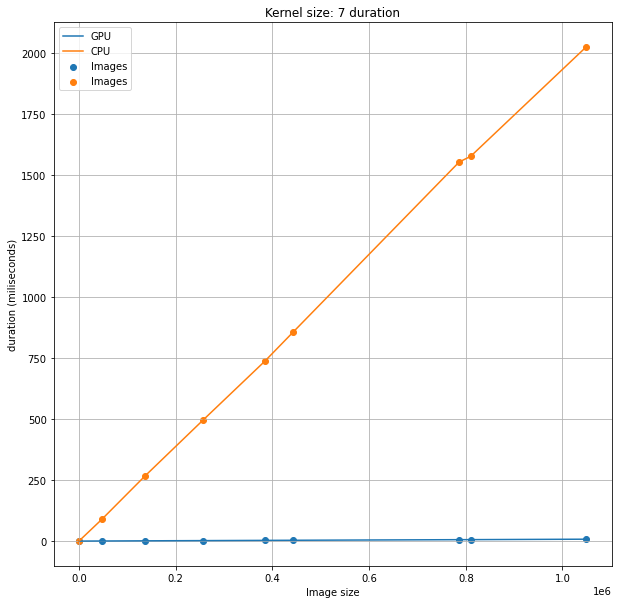

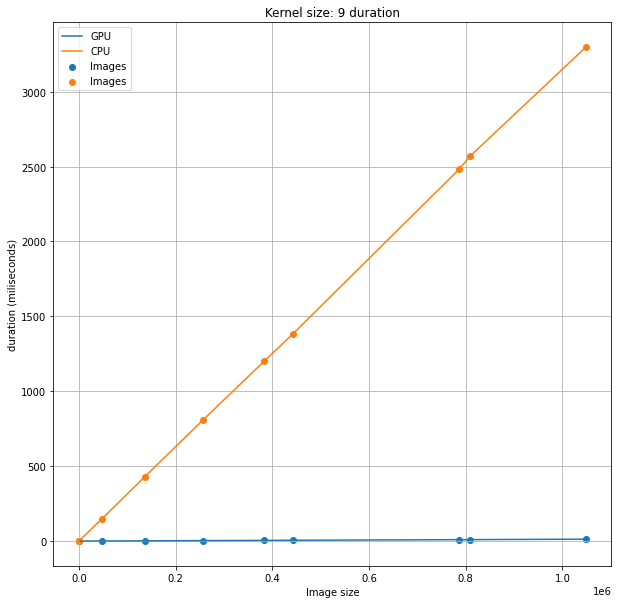

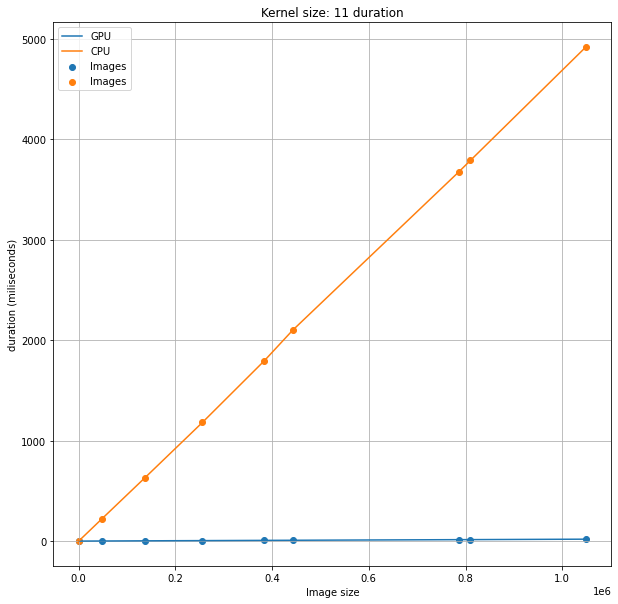

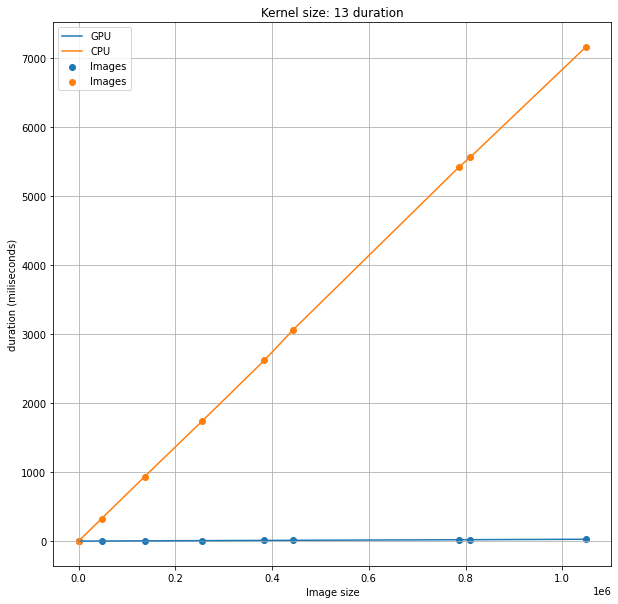

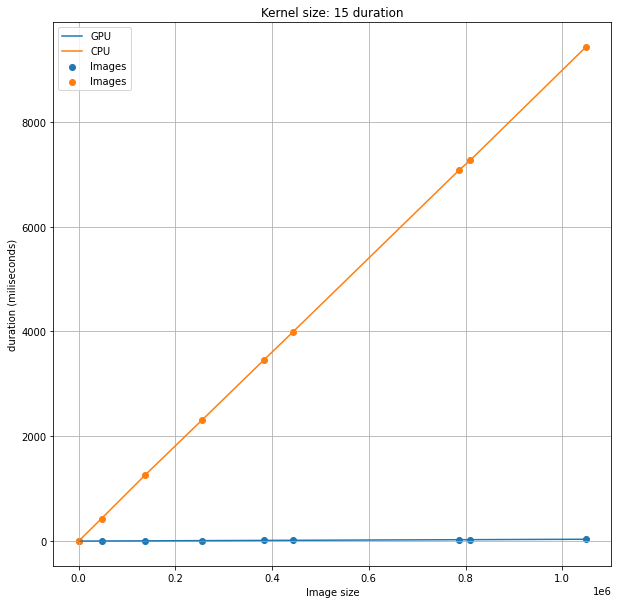

In [112]:
for kernel_size in time_data.kernel_size.unique():
  kernel_data = time_data[time_data.kernel_size == kernel_size]
  gpu_data = kernel_data[kernel_data["type"] == "GPU"].sort_values("image_size")
  cpu_data = kernel_data[kernel_data["type"] == "CPU"].sort_values("image_size")
  plt.figure(figsize=(10,10))
  plt.plot(gpu_data.image_size, gpu_data.duration, label="GPU")
  plt.plot(cpu_data.image_size, cpu_data.duration, label="CPU")
  plt.scatter(gpu_data.image_size, gpu_data.duration, label="Images")
  plt.scatter(cpu_data.image_size, cpu_data.duration, label="Images")
  plt.title("Kernel size: " + str(kernel_size) + " duration")
  plt.xlabel("Image size")
  plt.ylabel("duration (miliseconds)")
  plt.legend()
  plt.grid()
  plt.show()


# Скорость только для GPU

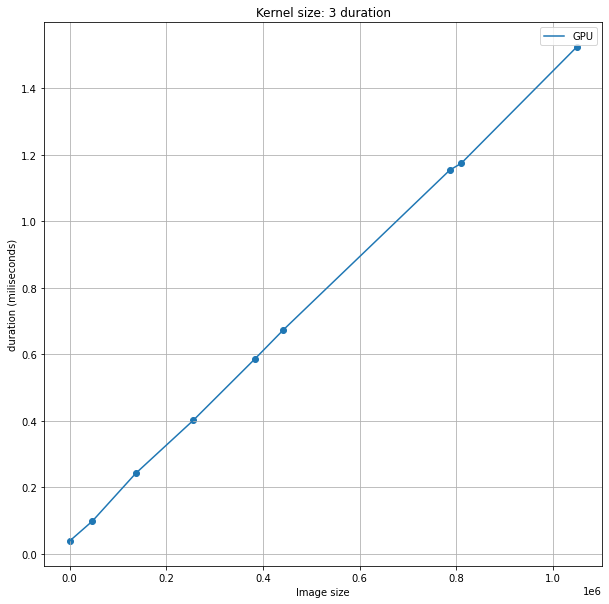

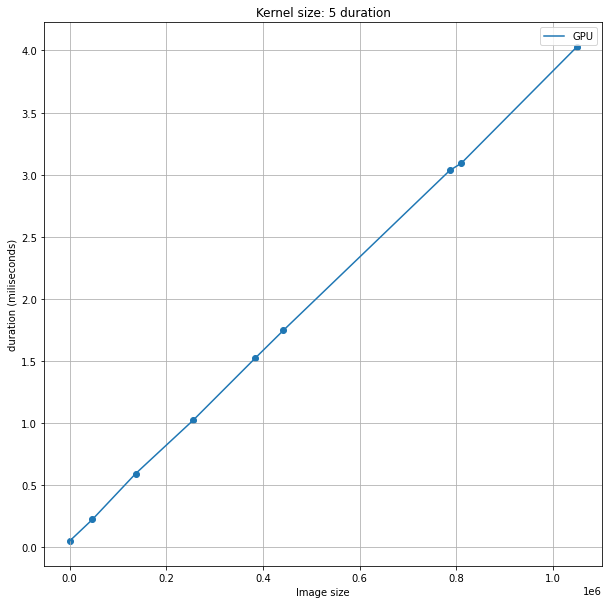

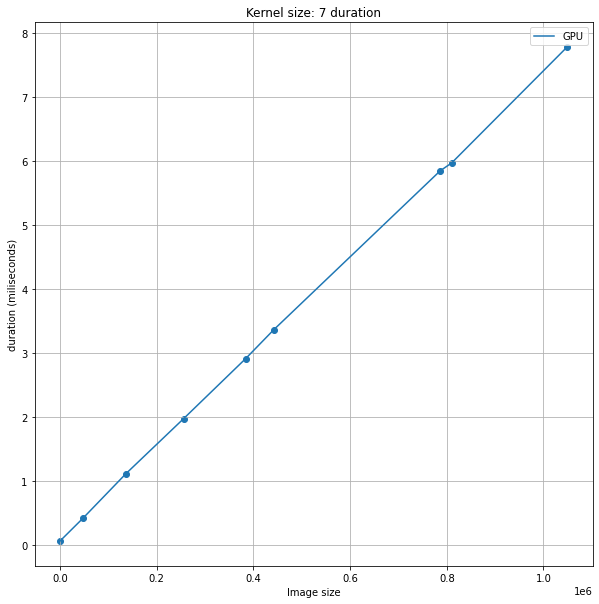

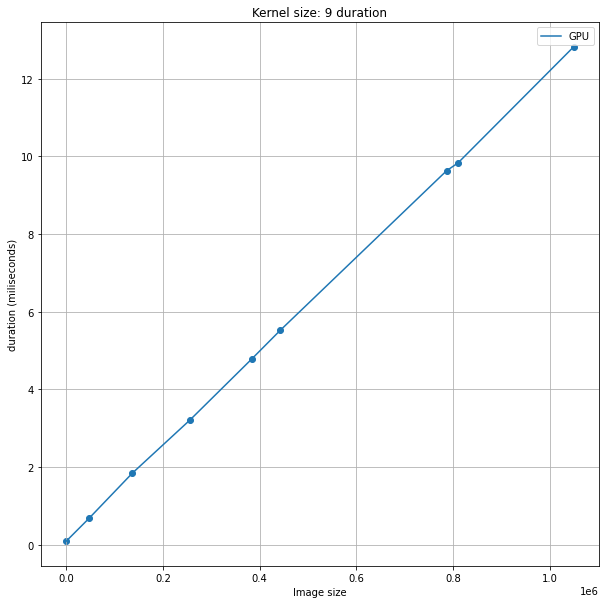

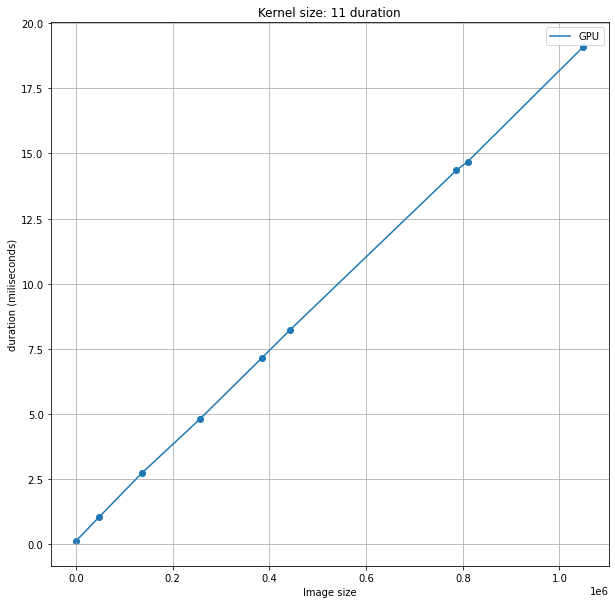

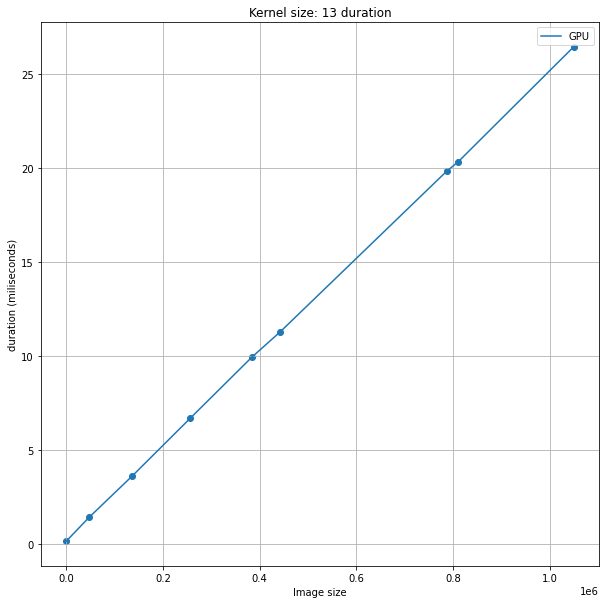

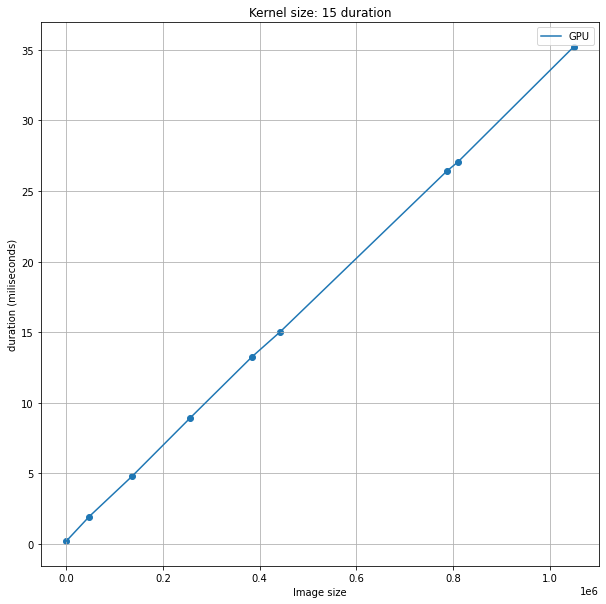

In [111]:
for kernel_size in time_data.kernel_size.unique():
  kernel_data = time_data[time_data.kernel_size == kernel_size]
  gpu_data = kernel_data[kernel_data["type"] == "GPU"].sort_values("image_size")
  plt.figure(figsize=(10,10))
  plt.plot(gpu_data.image_size, gpu_data.duration, label="GPU")
  plt.scatter(gpu_data.image_size, gpu_data.duration)
  plt.title("Kernel size: " + str(kernel_size) + " duration")
  plt.xlabel("Image size")
  plt.ylabel("duration (miliseconds)")
  plt.legend()
  plt.grid()
  plt.show()
